<a id="0"></a>
# <p style="background-color:#0FA1F0;height: 60px;text-align: center;vertical-align: middle;line-height: 60px;;font-family:helvetica;color:#FFFFFF;font-size:120%;text-align:center;border-radius:12px 12px;"> INTRODUCTION</p>

This notebook aims to show some audio treatments that were used in the BIRDCLEF-2022 Competition.

We use this code to treat the sounds of birds, minimizing noise and interference. At the end of the treated audio, we added some noises such as pink noise, white noise, etc.

We followed the steps mentioned in the figure.
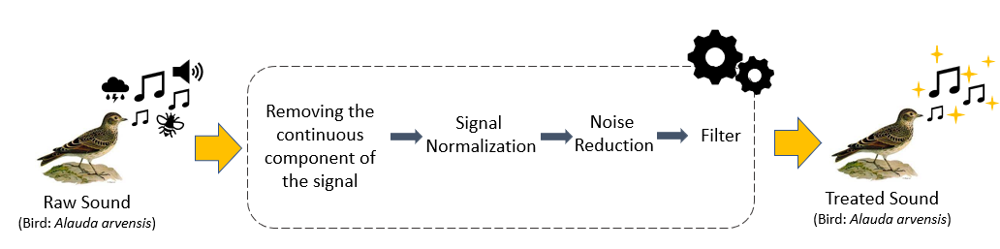

We leave the code below.

Enjoy :)

<a id="0"></a>
# <p style="background-color:#0FA1F0;height: 60px;text-align: center;vertical-align: middle;line-height: 60px;;font-family:helvetica;color:#FFFFFF;font-size:120%;text-align:center;border-radius:12px 12px;"> LIBRARIES</p>

In [1]:
%pip install noisereduce
%pip install colorednoise
%pip install seaborn librosa plotly

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                                    LIBRARIES
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

# Matrix and Arrays
import numpy as np
import pandas as pd

# Random
import random

# Graphics
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from PIL import Image

# Signal
import scipy
from scipy.fftpack import rfft, irfft, fftfreq, fft
from scipy.signal import butter, sosfilt, sosfreqz, filtfilt
from scipy.signal import hilbert
from scipy.io.wavfile import write

# Audio
import librosa
import librosa.display
import IPython.display as ipd
import noisereduce as nr
import soundfile as sf

# Sklearn
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import KMeans
from sklearn.model_selection import StratifiedKFold, train_test_split

# Math
from math import ceil

# Files
import os
import json

from tqdm.auto import tqdm
# from tqdm import tqdm
from functools import partial
from joblib import Parallel, delayed

# Warnings
import warnings
warnings.simplefilter('ignore')


<a id="0"></a>
# <p style="background-color:#0FA1F0;height: 60px;text-align: center;vertical-align: middle;line-height: 60px;;font-family:helvetica;color:#FFFFFF;font-size:120%;text-align:center;border-radius:12px 12px;"> CONFIGURATION CLASS</p>

In [3]:
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                                    CONFIG
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
class CONFIG:
    # Paths
    path_main = './birdclef-2022'
    path_output = './'
    path_audio = './birdclef-2022/train_audio'

    # # Compute Cluster
    # path_main = './kaggle/input/birdclef-2022'
    # path_output = './'
    # path_audio = './kaggle/input/birdclef-2022/train_audio'

    # Filter parameters (take the whole base or not)
    prop = 1

    signal_length: int = 15  # 5 Seconds
    mel_spec_fmin = 500
    mel_spec_fmax = 12500

    cnn_shape = (224, 224)
    # Audio Treatment Parameters
    sr = 22050
    n_fft = 2048
    win_length = 512
    lowcut = 955
    highcut = 7005
    order = 5

    # Noise Parameters
    white = True
    pink = True
    blue = False
    violet = False
    brownian = False
    alpha = 35
    beta = 5

    # Test
    test = True
    n = 1

    # Convert Files
    convert = False

    # Audio times
    time_max = 300  # 10 minutes
    time_min = 1  # 1 seconds

    # Save Parameters
    audio_extension = '.png'


<a id="0"></a>
# <p style="background-color:#0FA1F0;height: 60px;text-align: center;vertical-align: middle;line-height: 60px;;font-family:helvetica;color:#FFFFFF;font-size:120%;text-align:center;border-radius:12px 12px;"> DATA</p>

In [4]:
print('cwd: ', os.getcwd())
print(os.listdir(os.getcwd()))
print(f'[INFO] Files list:')
os.listdir(CONFIG.path_main)


cwd:  /mnt/batch/tasks/shared/LS_root/mounts/clusters/cpu-comp-jno/code/Users/j.nordhoff/GlobalAIBootcamp/BirdRecognize
['.amlignore', '.amlignore.amltmp', '.ipynb_aml_checkpoints', 'bird-sound-recognition.ipynb.amltmp', 'bird-sound-recognition_all.ipynb', 'bird-sound-recognition_all.ipynb.amltmp', 'bird-sound-recognition_cnn.ipynb', 'bird-sound-recognition_cnn.ipynb.amltmp', 'bird-sound-recognition_Efficient.ipynb', 'bird-sound-recognition_efficient.ipynb.amltmp', 'bird-sound-recognition_Resnet.ipynb', 'bird-sound-recognition_resnet.ipynb.amltmp', 'birdclef-2022', 'bird_model_cnn.h5', 'bird_model_efficientnetB0.h5', 'bird_model_resnet50.h5', 'generate_dataset.ipynb', 'generate_dataset.ipynb.amltmp', 'get_kaggle_data.ipynb', 'tmp', 'train_audio_dataset_img']
[INFO] Files list:


['.amlignore',
 '.amlignore.amltmp',
 'eBird_Taxonomy_v2021.csv',
 'sample_submission.csv',
 'scored_birds.json',
 'test.csv',
 'test_soundscapes',
 'train_audio',
 'train_metadata.csv']

In [5]:
train_meta = pd.read_csv(os.path.join(CONFIG.path_main, 'train_metadata.csv'))
test_data = pd.read_csv(os.path.join(CONFIG.path_main, 'test.csv'))
ebird_data = pd.read_csv(os.path.join(
    CONFIG.path_main, 'eBird_Taxonomy_v2021.csv'))
samp_subm = pd.read_csv(os.path.join(
    CONFIG.path_main, 'sample_submission.csv'))


with open(os.path.join(CONFIG.path_main, 'scored_birds.json')) as f:
    scored_birds = json.load(f)


train_meta_filtered = train_meta[train_meta.primary_label.isin(scored_birds)]\
    .reset_index()\
    .drop('index', axis=1)

train_meta_rest = train_meta[~train_meta.primary_label.isin(scored_birds)]\
    .reset_index()\
    .drop('index', axis=1)

if CONFIG.prop > 0.0 and CONFIG.prop != 1:
    _, base, _, _ = train_test_split(train_meta_rest,
                                     train_meta_rest.primary_label,
                                     test_size=CONFIG.prop,
                                     random_state=manualSeed,
                                     stratify=train_meta_rest.primary_label)
    train_meta_filtered = pd.concat([train_meta_filtered, base],
                                    ignore_index=True)
if CONFIG.prop == 0:
    train_meta_filtered = pd.concat([train_meta_filtered, train_meta_rest],
                                    ignore_index=True)


print('[INFO] Main information:')
print('\t-> Number of birds to be scored:', len(scored_birds))
print('\t-> Training Base:', train_meta.shape)
print('\t\t-> Total Classes:', len(train_meta.primary_label.unique()))
print('\t-> Filtered Training Base:', train_meta_filtered.shape)
print('\t\t-> Filtered Total Classes:',
      len(train_meta_filtered.primary_label.unique()))
print('\t-> Test Base:', test_data.shape)


[INFO] Main information:
	-> Number of birds to be scored: 21
	-> Training Base: (14852, 13)
		-> Total Classes: 152
	-> Filtered Training Base: (1266, 13)
		-> Filtered Total Classes: 21
	-> Test Base: (3, 4)


In [6]:
train_meta_filtered[train_meta_filtered.primary_label == 'skylar'].head()


,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,time,url,filename
628,skylar,[],['flight call'],53.3048,5.0800,Alauda arvensis,Eurasian Skylark,Sander Bot,Creative Commons Attribution-NonCommercial-Sha...,3.5,09:00,https://www.xeno-canto.org/112425,skylar/XC112425.ogg
629,skylar,[],['flight call'],52.3417,20.9314,Alauda arvensis,Eurasian Skylark,Jarek Matusiak,Creative Commons Attribution-NonCommercial-Sha...,5.0,14:00,https://www.xeno-canto.org/114459,skylar/XC114459.ogg
630,skylar,[],['flight call'],52.0813,21.1706,Alauda arvensis,Eurasian Skylark,Jarek Matusiak,Creative Commons Attribution-NonCommercial-Sha...,5.0,15:20,https://www.xeno-canto.org/128543,skylar/XC128543.ogg
631,skylar,[],['song'],52.7167,23.8334,Alauda arvensis,Eurasian Skylark,Mathias Ritschard,Creative Commons Attribution-NonCommercial-Sha...,3.0,00:00,https://www.xeno-canto.org/129473,skylar/XC129473.ogg
632,skylar,[],['song'],60.2513,17.1808,Alauda arvensis,Eurasian Skylark,Jelmer Poelstra,Creative Commons Attribution-NonCommercial-Sha...,3.5,07:30,https://www.xeno-canto.org/130423,skylar/XC130423.ogg


<a id="0"></a>
# <p style="background-color:#0FA1F0;height: 60px;text-align: center;vertical-align: middle;line-height: 60px;;font-family:helvetica;color:#FFFFFF;font-size:120%;text-align:center;border-radius:12px 12px;"> AUDIO TREATMENTS</p>

In [7]:
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                        FUNCTIONS NECESSARY FOR SIGNAL TREATMENT
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

def Main_Parameters(y_t, sr):
    """Function to get the main characteristics of the signal"""
    N = len(y_t)                                      # number of samples
    T = 1.0 / sr                                      # data period
    x_t = np.linspace(0.0, N*T, N)                    # time
    x_f = np.linspace(0.0, 1.0/(2.0*T), int(N/2))     # frequency
    return N, T, x_t, x_f

# ********************************************************************************************


def Removing_Component_Continue(y_t):
    """Function to remove continuous component from the signal"""
    mean_y = np.mean(y_t)
    y_ = y_t - mean_y
    return y_

# ********************************************************************************************


def Normalization_Signal(y_t):
    """Function to put the sign between -1 and 1"""
    max_y = np.max(y_t)
    y_ = y_t/max_y
    return y_

# ********************************************************************************************


def Reduction_Noise(y_t, sr, n_fft, win_length, use_tqdm=False, norm=False):
    """Function to reduce signal noise amplitudes"""
    y_ = nr.reduce_noise(y=y_t,
                         sr=sr,
                         n_fft=n_fft,
                         win_length=win_length,
                         use_tqdm=use_tqdm,
                         n_jobs=2)
    y_ = np.array(y_)
    if norm:
        y_ = Normalization_Signal(y_)
    return y_

# ********************************************************************************************


def Band_Pass_Filter(y_t, sr, lowcut, highcut, order):
    """Band pass filter"""
    nyq = 0.5 * sr
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='bandpass',
                  analog=False, output='ba')
    y_ = filtfilt(b, a, y_t)
#     sos = butter(order, normal_cutoff , analog=False, btype='lowpass', output='sos')
#     y = sosfilt(sos, data)
    return y_

# ********************************************************************************************


def Envelope(y_t, plot):
    """Hilbert transform"""
    analytical_signal = hilbert(y_t)
    y_ = np.abs(analytical_signal)
    if plot == True:
        hilbert_fft = fft(y_)
    else:
        hilbert_fft = 0
    return y_, hilbert_fft


In [8]:
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                            AUDIO TO IMAGE
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


def get_spectrograms(audio, sample_rate, file_path):
    sig = audio

    # Split signal into five second chunks
    sig_splits = []
    for i in range(0, len(sig), int(CONFIG.signal_length * sample_rate)):
        split = sig[i:i + int(CONFIG.signal_length * sample_rate)]

        # End of signal?
        if len(split) < int(CONFIG.signal_length * sample_rate):
            break

        sig_splits.append(split)

    # Extract mel spectrograms for each audio chunk
    s_cnt = 0
    saved_samples = []
    for chunk in sig_splits:
        hop_length = int(CONFIG.signal_length *
                         sample_rate / (CONFIG.cnn_shape[1] - 1))
        mel_spec = librosa.feature.melspectrogram(y=chunk,
                                                  sr=sample_rate,
                                                  n_fft=1024,
                                                  hop_length=hop_length,
                                                  n_mels=CONFIG.cnn_shape[0],
                                                  fmin=CONFIG.mel_spec_fmin,
                                                  fmax=CONFIG.mel_spec_fmax)
        mel_spec = librosa.power_to_db(mel_spec, ref=np.max)

        # Normalize
        mel_spec -= mel_spec.min()
        mel_spec /= mel_spec.max()

        # Save as image file
        save_path = file_path + '_' + str(s_cnt) + '.png'
        im = Image.fromarray(mel_spec * 255.0).convert("L")
        im.save(save_path)
        saved_samples.append(save_path)
        s_cnt += 1

    return saved_samples


def save_spectogram(path_audio_new, audio, sr):
    return get_spectrograms(audio, sample_rate=sr, file_path=path_audio_new[:-4])


def display_spectogram(audio, sr):
  path_audio_new = "./tmp/output_img"
  os.makedirs(os.path.dirname(path_audio_new), exist_ok=True)
  saved_samples = save_spectogram(path_audio_new, audio, sr)

  plt.figure(figsize=(20,10))
  columns = 5
  for i, ima in enumerate(saved_samples):
      plt.subplot(int(len(saved_samples) / columns + 1), columns, i + 1)
      image = plt.imread(ima)
      plt.imshow(image)

In [9]:
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                             FULL SIGNAL FUNCTION
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

def Complete_Treatment(y_t, sr,
                       n_fft=CONFIG.n_fft,
                       win_length=CONFIG.win_length,
                       use_tqdm=True,
                       low=CONFIG.lowcut,
                       high=CONFIG.highcut,
                       ord=CONFIG.order,
                       plot=True,
                       nome=None):
    """ Complete signal processing"""
    N, T, x_t, x_f = Main_Parameters(y_t, sr)
    if plot:
        y_f_0 = fft(y_t)

    y_1 = Removing_Component_Continue(y_t)
    if plot:
        y_f_1 = fft(y_1)

    y_2 = Normalization_Signal(y_1)
    if plot:
        y_f_2 = fft(y_2)

    y_3 = Reduction_Noise(y_2,
                          sr,
                          n_fft=n_fft,
                          win_length=win_length,
                          use_tqdm=use_tqdm,
                          norm=True)
    if plot:
        y_f_3 = fft(y_3)

    y_4 = Band_Pass_Filter(y_3, sr,
                           lowcut=low,
                           highcut=high,
                           order=ord)
    if plot:
        y_f_4 = fft(y_4)

    y_5, y_f_5 = Envelope(y_4, plot=plot)

    if plot:
        fig, ax = plt.subplots(figsize=(15, 12), nrows=6, ncols=2)
        if nome == None:
            fig.suptitle('Signal treatments')
        else:
            fig.suptitle(f'Signal treatments - bird: {nome}')

        ax[0, 0].plot(x_t, y_t)
        ax[0, 0].set_title('Raw Data')
        ax[0, 0].set_xlabel('t (s)')
        ax[0, 1].plot(x_f, 2.0/N * np.abs(y_f_0[:N//2]))
        ax[0, 1].set_title('Frequency')
        ax[0, 1].set_xlabel('Hz')

        ax[1, 0].plot(x_t, y_1)
        ax[1, 0].set_title('Data without Continuous Component')
        ax[1, 0].set_xlabel('t (s)')
        ax[1, 1].plot(x_f, 2.0/N * np.abs(y_f_1[:N//2]))
        ax[1, 1].set_title('Frequency')
        ax[1, 1].set_xlabel('Hz')

        ax[2, 0].plot(x_t, y_2)
        ax[2, 0].set_title('Normalized Data')
        ax[2, 0].set_xlabel('t (s)')
        ax[2, 1].plot(x_f, 2.0/N * np.abs(y_f_2[:N//2]))
        ax[2, 1].set_title('Frequency')
        ax[2, 1].set_xlabel('Hz')

        ax[3, 0].plot(x_t, y_3)
        ax[3, 0].set_title('Data with Noise Reduction')
        ax[3, 0].set_xlabel('t (s)')
        ax[3, 1].plot(x_f, 2.0/N * np.abs(y_f_3[:N//2]))
        ax[3, 1].set_title('Frequências')
        ax[3, 1].set_xlabel('Hz')

        ax[4, 0].plot(x_t, y_4)
        ax[4, 0].set_title('Filtered Data')
        ax[4, 0].set_xlabel('t (s)')
        ax[4, 1].plot(x_f, 2.0/N * np.abs(y_f_4[:N//2]))
        ax[4, 1].set_title('Frequency')
        ax[4, 1].set_xlabel('Hz')

        ax[5, 0].plot(x_t, y_5)
        ax[5, 0].set_title('Envelope')
        ax[5, 0].set_xlabel('t (s)')
        ax[5, 1].plot(x_f, 2.0/N * np.abs(y_f_5[:N//2]))
        ax[5, 1].set_title('Frequency')
        ax[5, 1].set_xlabel('Hz')

        plt.subplots_adjust(wspace=0.2, hspace=0.8)
        plt.show()

    return y_5, y_4, x_t


In [10]:
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                             NOISE FUNCTIONS
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
# https://stackoverflow.com/questions/67085963/generate-colors-of-noise-in-python

def noise_psd(N, psd=lambda f: 1):
    X_white = np.fft.rfft(np.random.randn(N))
    S = psd(np.fft.rfftfreq(N))
    S = S / np.sqrt(np.mean(S**2))
    X_shaped = X_white * S
    return np.fft.irfft(X_shaped)

# ********************************************************************************************


def PSDGenerator(f):
    return lambda N: noise_psd(N, f)

# ********************************************************************************************


@PSDGenerator
def white_noise(f):
    return 1


@PSDGenerator
def blue_noise(f):
    return np.sqrt(f)


@PSDGenerator
def violet_noise(f):
    return f


@PSDGenerator
def brownian_noise(f):
    return 1/np.where(f == 0, float('inf'), f)


@PSDGenerator
def pink_noise(f):
    return 1/np.where(f == 0, float('inf'), np.sqrt(f))


In [11]:
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                             NOISE ADD FUNCTIONS
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

def Add_Noise(y_t, N,
              white=CONFIG.white,
              pink=CONFIG.pink,
              blue=CONFIG.blue,
              violet=CONFIG.violet,
              brownian=CONFIG.brownian,
              alpha=CONFIG.alpha,  beta=CONFIG.beta):
    """ NOISE ADD FUNCTIONS"""
    new_signals = []
    d = {}
    index = 0

    if white:
        # noise = np.random.normal(loc=0, scale=1, size=N)
        noise = white_noise(N+5)
        y = y_t + noise[:len(y_t)]/alpha
        new_signals.append(y)
        index += 1
        d[index] = 'white_noise'

    if pink:
        noise = pink_noise(N+5)
        y = y_t + noise[:len(y_t)]/alpha
        new_signals.append(y)
        index += 1
        d[index] = 'pink_noise'

    if blue:
        noise = blue_noise(N+5)
        y = y_t + noise[:len(y_t)]/alpha
        new_signals.append(y)
        index += 1
        d[index] = 'blue_noise'

    if violet:
        noise = violet_noise(N+5)
        y = y_t + noise[:len(y_t)]/alpha
        new_signals.append(y)
        index += 1
        d[index] = 'violet_noise'

    if brownian:
        noise = brownian_noise(N+5)
        y = y_t + noise[:len(y_t)]*beta
        new_signals.append(y)
        index += 1
        d[index] = 'brownian_noise'

    return new_signals, d


<a id="0"></a>
# <p style="background-color:#0FA1F0;height: 60px;text-align: center;vertical-align: middle;line-height: 60px;;font-family:helvetica;color:#FFFFFF;font-size:120%;text-align:center;border-radius:12px 12px;"> TEST</p>




                         ############## EXEMPLE 623 ##############


  0%|          | 0/2 [00:00<?, ?it/s]

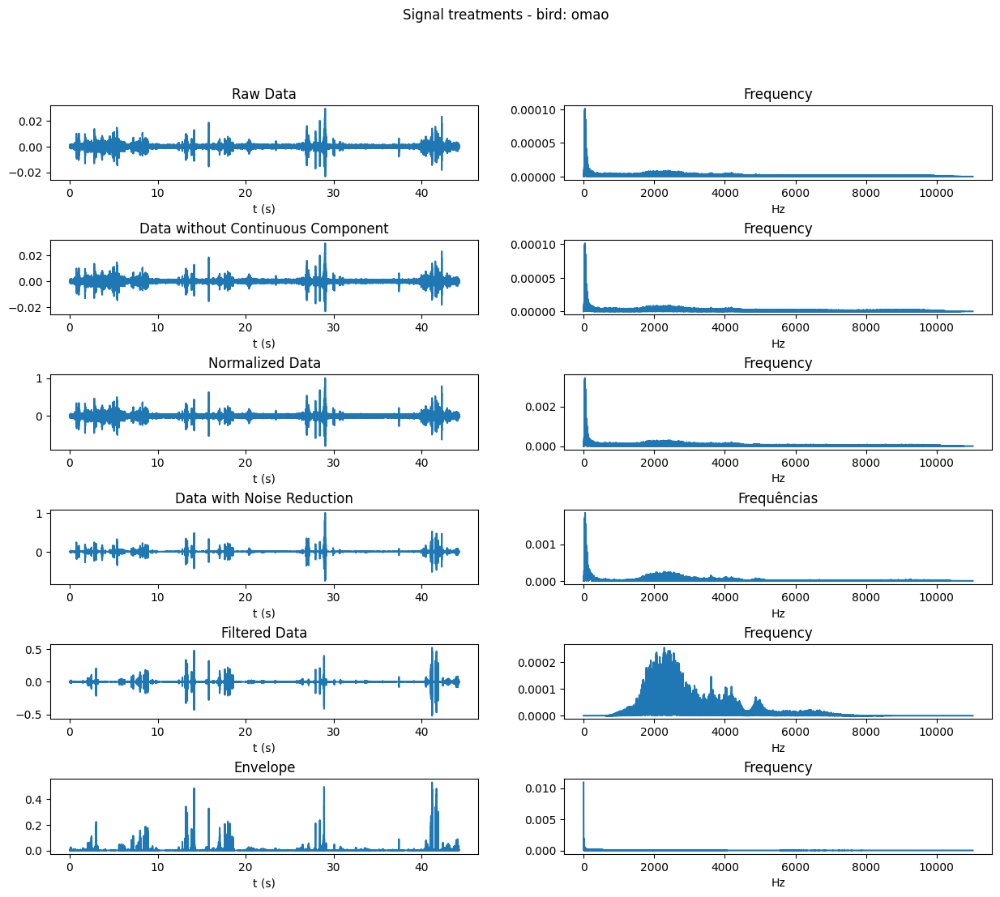


Audio: Original



Audio: treated_signal



Audio: white_noise



Audio: pink_noise


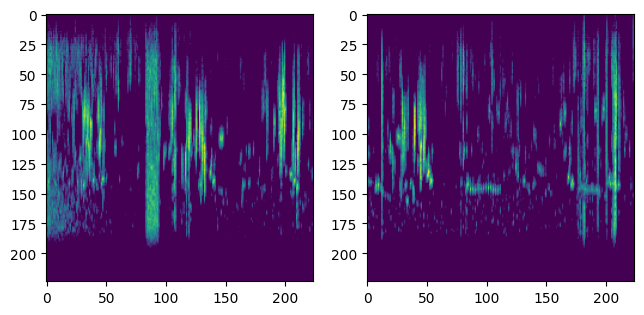

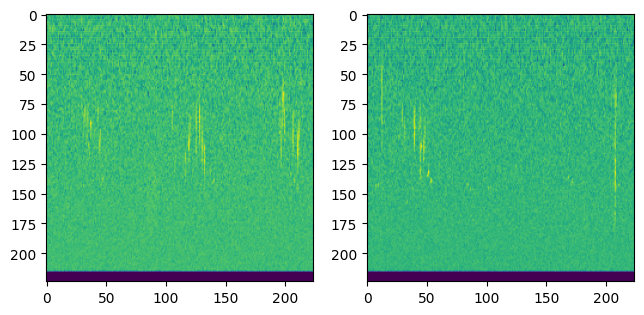

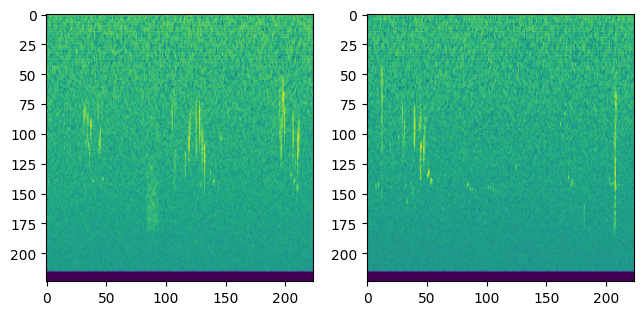

In [12]:
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                               TEST
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
if CONFIG.test:
    for i in range(CONFIG.n):
        path_audio = CONFIG.path_audio
        n = np.random.randint(0, len(train_meta_filtered))
        audio = train_meta_filtered.filename.values[n]
        bird = train_meta_filtered.primary_label.values[n]

        print(
            f'\n\n\n                         ############## EXEMPLE {n} ##############')

        y_t, sr = librosa.load(os.path.join(path_audio, audio))

        _, y_trat, x_t = Complete_Treatment(y_t,
                                            sr,
                                            plot=True,
                                            nome=bird)

        N, T, x_t, x_f = Main_Parameters(y_t, sr)
        y_noise, d = Add_Noise(y_trat, N)

        print(f'\nAudio: Original')
        display(ipd.Audio(y_t, rate=sr))

        Y_T = [y_trat] + y_noise
        d[0] = 'treated_signal'

        for i, audio in enumerate(Y_T):
            print(f'\nAudio:', d[i])
            display(ipd.Audio(audio, rate=sr))
            display_spectogram(audio, sr)


<a id="0"></a>
# <p style="background-color:#0FA1F0;height: 60px;text-align: center;vertical-align: middle;line-height: 60px;;font-family:helvetica;color:#FFFFFF;font-size:120%;text-align:center;border-radius:12px 12px;"> SAVE AUDIO</p>

In [13]:


# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
#                                SAVE FUNCTIONS
# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%


def Save_Audio(fn,
               number,
               path_in=CONFIG.path_audio,
               path_out=os.path.join(CONFIG.path_output, 'audio_dataset_todo'),
               audio_extension=CONFIG.audio_extension):

    path_audio = os.path.join(path_in, fn)

    # Sinal
    y_t, sr = librosa.load(path_audio)

    N, T, x_t, x_f = Main_Parameters(y_t, sr)

    # Treatments
    _, y_trat, x_t = Complete_Treatment(y_t,
                                        sr,
                                        plot=False)

    # Noises
    N, _, _, _ = Main_Parameters(y_t, sr)
    y_noise, d = Add_Noise(y_trat, N)

    Y_T = [y_trat] + y_noise
    d[0] = 'treated_signal'

    fn_ = fn.split('.')[0]

    for index, audio in enumerate(Y_T):
        path_audio_new = os.path.join(path_out,
                                      d[index],
                                      fn_ + f'_IDX_{number}_{d[index]}' + audio_extension)

        os.makedirs(os.path.dirname(path_audio_new), exist_ok=True)
        try:
          if audio_extension == '.wav':
              sf.write(path_audio_new, audio, sr, subtype='PCM_24')
          if audio_extension == '.ogg':
              sf.write(path_audio_new, audio, sr, format='ogg')
          if audio_extension == '.npy':
              np.save(path_audio_new, audio)
          if audio_extension == '.png':
              save_spectogram(path_audio_new, audio, sr)
        except:
          print(f"Failed exporting for image: {path_audio_new}")
          continue


In [14]:
if CONFIG.convert:
    df = train_meta_filtered

    for number, fn in enumerate(tqdm(df["filename"])):
        Save_Audio(fn=fn, number=number, path_out=os.path.join(CONFIG.path_output, 'train_audio_dataset_img'))

In [15]:
# if CONFIG.convert:
#     df = test_data
# 
#     for number, fn in enumerate(tqdm(df["filename"])):
#         Save_Audio(fn=fn, number=number, path_out=os.path.join(CONFIG.path_output, 'test_audio_dataset_img'))